# US Diocese Mapper

By Kenneth Burchfiel

Released under the MIT License

(The county_shapes.csv, county_shapes.geojson, state_fips_codes.csv, and counties_by_diocese.csv files are released into in the public domain.)

## Note:
This is still a work in progress, as I need to update the diocesan boundaries to account for situations where one county lies in multiple dioceses. (Until then, the map will contain a number of inaccuracies.) I also plan to add in cathedral locations and diocese names.

I also plan to add in more documentation/comments.

## Preliminary steps

First, I downloaded county shapefiles from the US Census bureau here: https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2021&layergroup=Counties+%28and+equivalent%29

See this note regarding use of the shapefiles: https://www2.census.gov/geo/pdfs/maps-data/data/tiger/tgrshp2021/TGRSHP2021_TechDoc_Ch1.pdf

Once you download the shapefiles to your computer, extract them using an unzipping utility. The shapefile document within this unzipped folder ends in .shp; for the 2021 county data, the file name is tl_2021_us_county.shp. 

It appears that the other files within this folder may also be used by Geopandas in the creation of GeoDataFrames, so I recommend accessing the file within the unzipped folder rather than copying it into your project folder.


In [1]:
import time
start_time = time.time()
import geopandas
import pandas as pd
import folium
import branca
import numpy as np
from selenium import webdriver
import PIL.Image
import IPython

In [2]:
generate_county_list = False

In [3]:
if generate_county_list == True:

    shapefile_path = \
        r'C:\Users\kburc\Downloads\tl_2021_us_county_download\tl_2021_us_county.shp'
    state_fips_codes = pd.read_html(
        'https://www.nrcs.usda.gov/wps/portal/nrcs/detail/national/technical/nra/nri/results/?cid=nrcs143_013696')[0]
    state_fips_codes = state_fips_codes.iloc[0:55].copy()
    state_fips_codes['FIPS'] = state_fips_codes['FIPS'].astype('int')
    state_fips_codes.rename(columns={'Name':'State_Name',
    'Postal Code':'State_Code'},inplace=True) 
    state_fips_codes.loc[55] = ['District of Columbia', 'DC', 11] # DC wasn't 
    # present in the original webpage, so I added it in. I located its FIPS code
    # within the county shapefile dataset.
    state_fips_codes.to_csv('state_fips_codes.csv')

    county_shapes = geopandas.read_file(shapefile_path)
    county_shapes['geometry'] = county_shapes.simplify(tolerance = 0.005) 
    county_shapes.drop(['CLASSFP', 'MTFCC', 'CSAFP', 'CBSAFP', 'METDIVFP', 
    'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON'], 
    axis = 1, inplace = True)
    county_shapes['STATEFP'] = county_shapes['STATEFP'].astype('int')

    merged_county_shapes = county_shapes.merge(state_fips_codes, 
    left_on = 'STATEFP', right_on = 'FIPS', how = 'left')
    merged_county_shapes['county_state'] = merged_county_shapes[
        'NAMELSAD'] + ', ' + merged_county_shapes['State_Name']

    merged_county_shapes.to_csv('county_shapes.csv')
    merged_county_shapes.to_file('county_shapes.geojson',
        driver = 'GeoJSON') 
    # The above line exports the GeoDataFrame created by prepare_zip_table 
    # so that it can be imported back into the program, which takes less time
    # than does recreating the GeoDataFrame.


In [4]:
merged_county_shapes_test = geopandas.read_file('county_shapes.geojson')
merged_county_shapes_test

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,State_Name,State_Code,FIPS,county_state,geometry
0,31,039,00835841,31039,Cuming,Cuming County,06,Nebraska,NE,31,"Cuming County, Nebraska","POLYGON ((-96.55515 41.91587, -96.55517 41.742..."
1,53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,Washington,WA,53,"Wahkiakum County, Washington","POLYGON ((-123.49077 46.38358, -123.21795 46.3..."
2,35,011,00933054,35011,De Baca,De Baca County,06,New Mexico,NM,35,"De Baca County, New Mexico","POLYGON ((-104.38368 34.69213, -104.33973 34.6..."
3,31,109,00835876,31109,Lancaster,Lancaster County,06,Nebraska,NE,31,"Lancaster County, Nebraska","POLYGON ((-96.68140 41.04566, -96.46387 41.045..."
4,31,129,00835886,31129,Nuckolls,Nuckolls County,06,Nebraska,NE,31,"Nuckolls County, Nebraska","POLYGON ((-98.04802 40.35066, -97.82082 40.350..."
...,...,...,...,...,...,...,...,...,...,...,...,...
3229,13,123,00351260,13123,Gilmer,Gilmer County,06,Georgia,GA,13,"Gilmer County, Georgia","POLYGON ((-84.30237 34.57832, -84.32878 34.583..."
3230,27,135,00659513,27135,Roseau,Roseau County,06,Minnesota,MN,27,"Roseau County, Minnesota","POLYGON ((-95.25857 48.88666, -95.23104 48.881..."
3231,28,089,00695768,28089,Madison,Madison County,06,Mississippi,MS,28,"Madison County, Mississippi","POLYGON ((-90.14883 32.40026, -90.24376 32.400..."
3232,48,227,01383899,48227,Howard,Howard County,06,Texas,TX,48,"Howard County, Texas","POLYGON ((-101.18138 32.21252, -101.18400 32.0..."


In [5]:
merged_county_shapes_test.set_index('county_state', inplace = True)
merged_county_shapes_test

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,State_Name,State_Code,FIPS,geometry
county_state,,,,,,,,,,,
"Cuming County, Nebraska",31,039,00835841,31039,Cuming,Cuming County,06,Nebraska,NE,31,"POLYGON ((-96.55515 41.91587, -96.55517 41.742..."
"Wahkiakum County, Washington",53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,Washington,WA,53,"POLYGON ((-123.49077 46.38358, -123.21795 46.3..."
"De Baca County, New Mexico",35,011,00933054,35011,De Baca,De Baca County,06,New Mexico,NM,35,"POLYGON ((-104.38368 34.69213, -104.33973 34.6..."
"Lancaster County, Nebraska",31,109,00835876,31109,Lancaster,Lancaster County,06,Nebraska,NE,31,"POLYGON ((-96.68140 41.04566, -96.46387 41.045..."
"Nuckolls County, Nebraska",31,129,00835886,31129,Nuckolls,Nuckolls County,06,Nebraska,NE,31,"POLYGON ((-98.04802 40.35066, -97.82082 40.350..."
...,...,...,...,...,...,...,...,...,...,...,...
"Gilmer County, Georgia",13,123,00351260,13123,Gilmer,Gilmer County,06,Georgia,GA,13,"POLYGON ((-84.30237 34.57832, -84.32878 34.583..."
"Roseau County, Minnesota",27,135,00659513,27135,Roseau,Roseau County,06,Minnesota,MN,27,"POLYGON ((-95.25857 48.88666, -95.23104 48.881..."
"Madison County, Mississippi",28,089,00695768,28089,Madison,Madison County,06,Mississippi,MS,28,"POLYGON ((-90.14883 32.40026, -90.24376 32.400..."


In [6]:
merged_county_shapes_test[
    'county_state_column'] = merged_county_shapes_test.index
merged_county_shapes_test.to_file('county_shapes_test.geojson',
    driver = 'GeoJSON') 
merged_county_shapes_test


,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,State_Name,State_Code,FIPS,geometry,county_state_column
county_state,,,,,,,,,,,,
"Cuming County, Nebraska",31,039,00835841,31039,Cuming,Cuming County,06,Nebraska,NE,31,"POLYGON ((-96.55515 41.91587, -96.55517 41.742...","Cuming County, Nebraska"
"Wahkiakum County, Washington",53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,Washington,WA,53,"POLYGON ((-123.49077 46.38358, -123.21795 46.3...","Wahkiakum County, Washington"
"De Baca County, New Mexico",35,011,00933054,35011,De Baca,De Baca County,06,New Mexico,NM,35,"POLYGON ((-104.38368 34.69213, -104.33973 34.6...","De Baca County, New Mexico"
"Lancaster County, Nebraska",31,109,00835876,31109,Lancaster,Lancaster County,06,Nebraska,NE,31,"POLYGON ((-96.68140 41.04566, -96.46387 41.045...","Lancaster County, Nebraska"
"Nuckolls County, Nebraska",31,129,00835886,31129,Nuckolls,Nuckolls County,06,Nebraska,NE,31,"POLYGON ((-98.04802 40.35066, -97.82082 40.350...","Nuckolls County, Nebraska"
...,...,...,...,...,...,...,...,...,...,...,...,...
"Gilmer County, Georgia",13,123,00351260,13123,Gilmer,Gilmer County,06,Georgia,GA,13,"POLYGON ((-84.30237 34.57832, -84.32878 34.583...","Gilmer County, Georgia"
"Roseau County, Minnesota",27,135,00659513,27135,Roseau,Roseau County,06,Minnesota,MN,27,"POLYGON ((-95.25857 48.88666, -95.23104 48.881...","Roseau County, Minnesota"
"Madison County, Mississippi",28,089,00695768,28089,Madison,Madison County,06,Mississippi,MS,28,"POLYGON ((-90.14883 32.40026, -90.24376 32.400...","Madison County, Mississippi"


In [7]:
merged_county_shapes_test['Diocese'] = 'Not_Set'

In [8]:
condlist = [
merged_county_shapes_test['State_Name'] == 'Alabama',
merged_county_shapes_test['State_Name'] == 'Alaska',
merged_county_shapes_test['State_Name'] == 'Arizona',
merged_county_shapes_test['State_Name'] == 'Arkansas',
merged_county_shapes_test['State_Name'] == 'California',
merged_county_shapes_test['State_Name'] == 'Colorado',
merged_county_shapes_test['State_Name'] == 'Connecticut',
merged_county_shapes_test['State_Name'] == 'Delaware',
merged_county_shapes_test['State_Name'] == 'Florida',
merged_county_shapes_test['State_Name'] == 'Georgia',
merged_county_shapes_test['State_Name'] == 'Hawaii',
merged_county_shapes_test['State_Name'] == 'Idaho',
merged_county_shapes_test['State_Name'] == 'Illinois',
merged_county_shapes_test['State_Name'] == 'Indiana',
merged_county_shapes_test['State_Name'] == 'Iowa',
merged_county_shapes_test['State_Name'] == 'Kansas',
merged_county_shapes_test['State_Name'] == 'Kentucky',
merged_county_shapes_test['State_Name'] == 'Louisiana',
merged_county_shapes_test['State_Name'] == 'Maine',
merged_county_shapes_test['State_Name'] == 'Maryland',
merged_county_shapes_test['State_Name'] == 'Massachusetts',
merged_county_shapes_test['State_Name'] == 'Michigan',
merged_county_shapes_test['State_Name'] == 'Minnesota',
merged_county_shapes_test['State_Name'] == 'Mississippi',
merged_county_shapes_test['State_Name'] == 'Missouri',
merged_county_shapes_test['State_Name'] == 'Montana',
merged_county_shapes_test['State_Name'] == 'Nebraska',
merged_county_shapes_test['State_Name'] == 'Nevada',
merged_county_shapes_test['State_Name'] == 'New Hampshire',
merged_county_shapes_test['State_Name'] == 'New Jersey',
merged_county_shapes_test['State_Name'] == 'New Mexico',
merged_county_shapes_test['State_Name'] == 'New York',
merged_county_shapes_test['State_Name'] == 'North Carolina',
merged_county_shapes_test['State_Name'] == 'North Dakota',
merged_county_shapes_test['State_Name'] == 'Ohio',
merged_county_shapes_test['State_Name'] == 'Oklahoma',
merged_county_shapes_test['State_Name'] == 'Oregon',
merged_county_shapes_test['State_Name'] == 'Pennsylvania',
merged_county_shapes_test['State_Name'] == 'Rhode Island',
merged_county_shapes_test['State_Name'] == 'South Carolina',
merged_county_shapes_test['State_Name'] == 'South Dakota',
merged_county_shapes_test['State_Name'] == 'Tennessee',
merged_county_shapes_test['State_Name'] == 'Texas',
merged_county_shapes_test['State_Name'] == 'Utah',
merged_county_shapes_test['State_Name'] == 'Vermont',
merged_county_shapes_test['State_Name'] == 'Virginia',
merged_county_shapes_test['State_Name'] == 'Washington',
merged_county_shapes_test['State_Name'] == 'West Virginia',
merged_county_shapes_test['State_Name'] == 'Wisconsin',
merged_county_shapes_test['State_Name'] == 'Wyoming',
merged_county_shapes_test['State_Name'] == 'District of Columbia',
merged_county_shapes_test['State_Name'] == 'Virgin Islands'
]

In [9]:
choicelist = [

# merged_county_shapes_test['State_Name'] == 'Alabama',
'Mobile',

# merged_county_shapes_test['State_Name'] == 'Alaska',
'Fairbanks',

# merged_county_shapes_test['State_Name'] == 'Arizona',
'Phoenix',

# merged_county_shapes_test['State_Name'] == 'Arkansas',
'Little Rock', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'California',
'Los Angeles', 

# merged_county_shapes_test['State_Name'] == 'Colorado',
'Pueblo',

# merged_county_shapes_test['State_Name'] == 'Connecticut',
'Norwich', 

# merged_county_shapes_test['State_Name'] == 'Delaware',
'Wilmington', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Florida',
'Orlando', 

# merged_county_shapes_test['State_Name'] == 'Georgia',
'Savannah',

# merged_county_shapes_test['State_Name'] == 'Hawaii',
'Honolulu', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Idaho',
'Boise', #Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Illinois',
'Peoria',

# merged_county_shapes_test['State_Name'] == 'Indiana',
'Indianapolis', 

# merged_county_shapes_test['State_Name'] == 'Iowa',
'Dubuque',

# merged_county_shapes_test['State_Name'] == 'Kansas',
'Salina',

# merged_county_shapes_test['State_Name'] == 'Kentucky',
'Lexington',

# merged_county_shapes_test['State_Name'] == 'Louisiana',
'Shreveport',

# merged_county_shapes_test['State_Name'] == 'Maine',
'Portland', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Maryland',
'Wilmington', 

# merged_county_shapes_test['State_Name'] == 'Massachusetts',
'Boston',

# merged_county_shapes_test['State_Name'] == 'Michigan',
'Marquette',

# merged_county_shapes_test['State_Name'] == 'Minnesota',
'Duluth',

# merged_county_shapes_test['State_Name'] == 'Mississippi',
'Jackson',

# merged_county_shapes_test['State_Name'] == 'Missouri',
'Springfield-Cape Girardeau',

# merged_county_shapes_test['State_Name'] == 'Montana',
'Helena',

# merged_county_shapes_test['State_Name'] == 'Nebraska',
'Grand Island',

# merged_county_shapes_test['State_Name'] == 'Nevada',
'Reno',

# merged_county_shapes_test['State_Name'] == 'New Hampshire',
'Manchester', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'New Jersey',
'Camden',

# merged_county_shapes_test['State_Name'] == 'New Mexico',
'Santa Fe',

# merged_county_shapes_test['State_Name'] == 'New York',
'Albany',

# merged_county_shapes_test['State_Name'] == 'North Carolina',
'Raleigh',

# merged_county_shapes_test['State_Name'] == 'North Dakota',
'Fargo',

# merged_county_shapes_test['State_Name'] == 'Ohio',
'Columbus',

# merged_county_shapes_test['State_Name'] == 'Oklahoma',
'Oklahoma City',

# merged_county_shapes_test['State_Name'] == 'Oregon',
'Portland',

# merged_county_shapes_test['State_Name'] == 'Pennsylvania',
'Erie',

# merged_county_shapes_test['State_Name'] == 'Rhode Island',
'Providence', #Statewide diocese

# merged_county_shapes_test['State_Name'] == 'South Carolina',
'Charleston', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'South Dakota',
'Sioux Falls',

# merged_county_shapes_test['State_Name'] == 'Tennessee',
'Nashville',

# merged_county_shapes_test['State_Name'] == 'Texas',
'Lubbock',

# merged_county_shapes_test['State_Name'] == 'Utah',
'Salt Lake City', # Statewide Diocese

# merged_county_shapes_test['State_Name'] == 'Vermont',
'Burlington', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Virginia',
'Richmond',

# merged_county_shapes_test['State_Name'] == 'Washington',
'Seattle',

# merged_county_shapes_test['State_Name'] == 'West Virginia',
'Wheeling-Charleston', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'Wisconsin',
'La Crosse',

# merged_county_shapes_test['State_Name'] == 'Wyoming'],
'Cheyenne', # Statewide diocese

# merged_county_shapes_test['State_Name'] == 'District of Columbia',
'Washington',

# merged_county_shapes_test['State_Name'] == 'Virgin Islands'
'Saint Thomas'
]

In [10]:
merged_county_shapes_test['Diocese'] = np.select(condlist, choicelist, merged_county_shapes_test['Diocese'])

In [11]:
merged_county_shapes_test = merged_county_shapes_test.query(
    "State_Name != 'Puerto Rico'").copy() # Puerto Rico belongs to a different
    # episcopal conference, so it won't be included in this dataset.

In [12]:
initial_version_of_merged_county_shapes_test = \
merged_county_shapes_test.copy()

In [13]:
def add_dioceses(df, county_list, state, diocese):
    # Adds the diocese for all counties in a given state. If a diocese spans
    # multiple stats, this function will need to be called once for each
    # state.
    # If a given 'county' variable does not have any spaces, 
    # the loop below will add ' County' to that string before 
    # adding in the state. Otherwise, the code assumes that the 'county' is
    # either a non-county (e.g. a municipality, city, census area, parish,
    # or borough), and will only add the state to this string.
    # Therefore, in order to run this function successfully, enter the 
    # area designation (county, city, etc.) after all non-counties and
    # counties with more than one word when building the county list.
    # However, you don't need to add in 'County' for counties with only
    # one word.
    for county in county_list:
        if ' ' not in county:
            county_string = county + ' County, ' + state
        else:
            county_string = county + ', ' + state
        if county_string not in df.index:
            raise ValueError(county_string, "not found in index")
        df.at[county_string, 'Diocese'] = diocese
    return df




List of dioceses:
https://en.wikipedia.org/wiki/List_of_Catholic_dioceses_in_the_United_States


In [14]:
# Diocese of Anchorage-Juneau:
# Source: Wikipedia province map

anchorage_juneau_county_list = [
'Aleutians West Census Area',
'Aleutians East Borough', 'Lake and Peninsula Borough',
'Bristol Bay Borough', 'Dillingham Census Area', 'Kodiak Island Borough',
'Kenai Peninsula Borough', 'Chugach Census Area', 'Yakutat City and Borough',
'Aleutians West Census Area', 'Hoonah-Angoon Census Area',
'Petersburg Borough', 'Wrangell City and Borough', 'Ketchikan Gateway Borough',
'Prince of Wales-Hyder Census Area', 'Sitka City and Borough',
'Copper River Census Area', 'Matanuska-Susitna Borough',
'Anchorage Municipality', 'Juneau City and Borough', 'Skagway Municipality',
'Haines Borough'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
anchorage_juneau_county_list, state = 'Alaska', diocese = 'Anchorage-Juneau')

# Archdiocese of Atlanta (Source: Diocesan website:
# https://archatl.com/about/about-the-archdiocese-of-atlanta/)
# This site noted the counties within the Archdiocese of Atlanta that border
# the Diocese of Savannah. I entered in those counties first, then added in
# all other counties to the north of those.

atlanta_county_list = [
'Gilmer', 'Carroll', 'Douglas', 'Clayton', 'Spalding', 'Henry', 'Rockdale',
'Oconee', 'Barrow', 'Jackson', 'Madison', 'Elbert', 'Rabun', 'Towns',
'Union', 'Fannin', 'Murray', 'Catoosa', 'Whitfield', 'Dade', 'Walker',
'Chattooga', 'Gordon', 'Pickens', 'Dawson', 'Lumpkin', 'White', 'Habersham',
'Stephens', 'Hart', 'Franklin', 'Banks', 'Hall', 'Forsyth', 'Fulton',
'Cherokee', 'Bartow', 'Floyd', 'Polk', 'Haralson', 'Paulding', 'Cobb',
'DeKalb', 'Gwinnett', 'Walton', 'Clarke', 'Oglethorpe', 'Coweta', 'Wilkes',
'Coweta', 'Taliaferro', 'Greene', 'Morgan', 'Coweta', 'Newton', 'Butts', 
'Lamar', 'Pike', 'Coweta', 'Fayette', 'Coweta', 'Heard', 'Troup', 'Meriwether',
'Upson', 'Monroe', 'Jasper', 'Putnam', 'Baldwin', 'Hancock', 'Warren',
'McDuffie', 'Lincoln'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
atlanta_county_list, state = 'Georgia', diocese = 'Atlanta')

# # Diocese of Charlotte:
# Source: https://web.archive.org/web/20110504140939/http://www.charlottediocese.org/atlasofthediocese.html (See also:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Charlotte#/media/File:Diocese_of_Charlotte.jpg)

charlotte_county_list = [
'Richmond', 'Montgomery', 'Randolph', 'Guilford', 'Rockingham', 'Mecklenburg', 
'Davie', 'Yadkin', 'Surry', 'Alleghany', 'Wilkes', 'Iredell', 'Catawba', 
'Lincoln', 'Gaston', 'Cleveland', 'Stokes', 'Forsyth', 'Davidson', 'Rowan', 
'Stanly', 'Anson', 'Union', 'Cabarrus', 'Cherokee', 'Graham', 'Swain', 
'Haywood', 'Madison', 'Ashe', 'Watauga', 'Caldwell', 'Alexander', 'Burke', 
'McDowell', 'Rutherford', 'Polk', 'Henderson', 'Buncombe', 'Yancey', 'Mitchell', 
'Clay', 'Macon', 'Jackson', 'Transylvania', 'Avery'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
charlotte_county_list, state = 'North Carolina', diocese = 'Charlotte')

# Archdiocese of Baltimore:
# https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Baltimore

baltimore_county_list = [
'Anne Arundel County', 'Baltimore', 'Carroll', 'Frederick', 'Garrett', 
'Harford', 'Howard', 'Washington', 'Baltimore city','Allegany'
] 
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
baltimore_county_list, state = 'Maryland', diocese = 'Baltimore')

# Diocese of Arlington:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Arlington

arlington_county_list = [
'Arlington', 'Clarke', 'Culpeper', 'Fairfax', 'Fauquier', 'Frederick', 
'King George County', 'Lancaster', 'Loudoun', 'Madison', 'Northumberland', 
'Orange', 'Page', 'Prince William County', 'Rappahannock', 'Richmond',
'Shenandoah', 'Spotsylvania', 'Stafford', 'Warren', 'Westmoreland', 
'Alexandria city', 'Falls Church city', 'Fairfax city', 'Fredericksburg city',
'Manassas city', 'Manassas Park city', 'Winchester city'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
arlington_county_list, state = 'Virginia', diocese = 'Arlington')

# Archdiocese of Washington:
# https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Washington
# Note that the Archdiocese of Washington includes a number of counties
# in Maryland, which will be added here. The District of Columbia is already
# listed as belonging to the Diocese of Washington.
washington_county_list = [
'Calvert', 'Charles', 'Montgomery', 
"Prince George's County", "St. Mary's County"
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
washington_county_list, state = 'Maryland', diocese = 'Washington')


# # Diocese of Fall River:
# # https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Fall_River

fall_river_county_list = [
'Barnstable', 'Bristol', 'Dukes', 'Nantucket'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
fall_river_county_list, state = 'Massachusetts', diocese = 'Fall River')

# Diocese of Springfield in Massachusetts:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Springfield_in_Massachusetts

springfield_in_massachusetts_county_list = [
'Berkshire', 'Franklin', 'Hampshire', 'Hampden'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
springfield_in_massachusetts_county_list, state = 'Massachusetts', diocese = 
'Springfield in Massachusetts')

# Diocese of Worcester: 
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Worcester

merged_county_shapes_test.at[
"Worcester County, Massachusetts", 'Diocese'] = 'Worcester' 
# The Diocese of Worcester includes only one county, so it can
# be added directly to the DataFrame.

# Archdiocese of Chicago: 
# https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Chicago

chicago_county_list = [
'Cook', 'Lake'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
chicago_county_list, state = 'Illinois', diocese = 
'Chicago')

# # Diocese of Belleville:
# # I couldn't find a list of counties on the diocese's website
# # or on the Diocese's Wikipedia page, so I based the county
# # list off this map:
# # https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Belleville#/media/File:Diocese_of_Belleville_map_1.png

belleville_county_list = [
"St. Clair County", "Clinton", "Marion", "Clay", "Richland", "Lawrence", 
"Wabash", "Edwards", "Wayne", "Monroe", "Washington", "Jefferson", "Hamilton", 
"White", "Gallatin", "Saline", "Williamson", "Jackson", "Union", "Johnson", 
"Pope", "Massac", "Pulaski", "Alexander", "Randolph", "Perry", "Franklin", 
"Hardin"
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
belleville_county_list, state = 'Illinois', diocese = 
'Belleville')

# # Diocese of Joliet:
# # https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Joliet_in_Illinois

joliet_county_list = [
"DuPage", "Ford", "Grundy", "Iroquois", "Kankakee", "Kendall", "Will"
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
joliet_county_list, state = 'Illinois', diocese = 
'Joliet')

# Diocese of Rockford:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Rockford

rockford_county_list = [
"Boone", "Carroll", "DeKalb", "Jo Daviess County", "Kane", "Lee", "McHenry",
"Ogle", "Stephenson", "Whiteside", "Winnebago"
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
rockford_county_list, state = 'Illinois', diocese = 
'Rockford')

springfield_in_illinois_county_list = [
"Adams", "Bond", "Brown", "Calhoun", "Cass", "Christian", "Clark", "Coles", 
"Crawford", "Cumberland", "Douglas", "Edgar", "Effingham", "Fayette", "Greene", 
"Jasper", "Jersey", "Macon", "Macoupin", "Madison", "Menard", "Moultrie", 
"Montgomery", "Morgan", "Pike", "Sangamon", "Scott", "Shelby"
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
springfield_in_illinois_county_list, state = 'Illinois', diocese = 
'Springfield in Illinois')

# Archdiocese of Cincinnati:
# Source: https://catholicaoc.org/about/geography

cincinnati_county_list = [
'Mercer', 'Auglaize', 'Logan', 'Darke', 'Shelby', 'Miami', 'Clark', 'Preble', 
'Montgomery', 'Greene', 'Butler', 'Warren', 'Clinton', 'Hamilton', 'Clermont', 
'Brown', 'Highland', 'Adams', 'Champaign'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
cincinnati_county_list, state = 'Ohio', diocese = 
'Cincinnati')

# Diocese of Cleveland: 
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Cleveland
cleveland_county_list = [
'Ashland', 'Cuyahoga', 'Geauga', 'Lake', 'Lorain',
'Medina', 'Summit', 'Wayne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
cleveland_county_list, state = 'Ohio', diocese = 
'Cleveland')

# Diocese of Steubenville:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Steubenville
steubenville_county_list = [
'Athens', 'Belmont', 'Carroll', 'Gallia', 'Guernsey', 'Harrison', 'Jefferson', 
'Lawrence', 'Meigs', 'Morgan', 'Monroe', 'Noble', 'Washington'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
steubenville_county_list, state = 'Ohio', diocese = 
'Steubenville')

# Diocese of Toledo:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Toledo

toledo_county_list = [
'Allen', 'Crawford', 'Defiance', 'Erie', 'Fulton',
'Hancock', 'Henry', 'Huron', 'Lucas', 'Ottawa', 'Paulding', 'Putnam', 
'Richland', 'Sandusky', 'Seneca', 'Van Wert County', 'Williams', 'Wood',
'Wyandot'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
toledo_county_list, state = 'Ohio', diocese = 
'Toledo')

# Diocese of Youngstown:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Youngstown

youngstown_county_list = [
'Mahoning', 'Trumbull', 'Columbiana', 'Stark', 'Portage', 'Ashtabula'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
youngstown_county_list, state = 'Ohio', diocese = 
'Youngstown')

# Archdiocese of Denver:
# Source: https://archden.org/wp-content/uploads/2021/11/2021_media_kit_updated_11-3-21.pdf
# This source incorrectly spells Broomfield County as 
# 'Bromfield.' 

denver_county_list = [
'Adams', 'Arapahoe', 'Boulder', 'Broomfield', 
'Clear Creek County', 'Denver', 'Eagle', 'Garfield',
'Gilpin', 'Grand', 'Jackson', 'Jefferson', 'Larimer',
'Logan', 'Moffat', 'Morgan', 'Phillips', 'Pitkin',
'Rio Blanco County', 'Routt', 'Sedgwick', 'Summit',
'Washington', 'Weld', 'Yuma'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
denver_county_list, state = 'Colorado', diocese = 
'Denver')


# # Diocese of Colorado Springs:
# # Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Colorado_Springs

colorado_springs_county_list = [
'Chaffee', 'Lake', 'Park', 'Teller', 'Douglas',
'El Paso County', 'Elbert', 'Lincoln', 
'Kit Carson County', 'Cheyenne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
colorado_springs_county_list, state = 'Colorado', diocese = 
'Colorado Springs')

# Archdiocese of Detroit:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Detroit

detroit_county_list = [
'Lapeer', 'Macomb', 'Monroe', 'Oakland', 'St. Clair County', 'Wayne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
detroit_county_list, state = 'Michigan', diocese = 
'Detroit')


# Diocese of Gaylord:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Gaylord

gaylord_county_list = [
'Charlevoix', 'Emmet', 'Cheboygan', 'Presque Isle County', 
'Leelanau', 'Antrim', 'Otsego', 'Montmorency', 'Alpena', 'Benzie', 
'Grand Traverse County', 'Kalkaska', 'Crawford', 'Oscoda', 'Alcona',
'Manistee', 'Wexford', 'Missaukee', 'Roscommon', 'Ogemaw', 'Iosco'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
gaylord_county_list, state = 'Michigan', diocese = 
'Gaylord')

# Diocese of Grand Rapids:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Grand_Rapids

grand_rapids_county_list = [
'Ottawa', 'Kent', 'Ionia', 'Muskegon', 'Newaygo', 'Oceana', 
'Montcalm', 'Mecosta', 'Lake', 'Mason', 'Osceola'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
grand_rapids_county_list, state = 'Michigan', diocese = 
'Grand Rapids')


# Diocese of Kalamazoo:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Kalamazoo
kalamazoo_county_list = [
'Allegan', 'Barry', 'Van Buren County', 'Kalamazoo', 'Calhoun', 
'Berrien', 'Cass', 'St. Joseph County', 'Branch'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
kalamazoo_county_list, state = 'Michigan', diocese = 
'Kalamazoo')

# Diocese of Lansing:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Lansing

lansing_county_list = [
'Clinton', 'Eaton', 'Genesee', 'Hillsdale', 'Ingham', 'Jackson', 
'Lenawee', 'Livingston', 'Shiawassee', 'Washtenaw'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
lansing_county_list, state = 'Michigan', diocese = 
'Lansing')


# Diocese of Saginaw:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Saginaw
saginaw_county_list = [
'Arenac', 'Bay', 'Clare', 'Gladwin', 'Gratiot', 'Huron', 'Isabella',
'Midland', 'Saginaw', 'Sanilac', 'Tuscola']

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
saginaw_county_list, state = 'Michigan', diocese = 
'Saginaw')

# Diocese of Davenport:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Davenport
# See also:
# https://d2y1pz2y630308.cloudfront.net/13543/documents/2020/8/Parishes%20Map%207-1-20.pdf
davenport_county_list = [
'Jasper', 'Poweshiek', 'Iowa', 'Johnson', 'Cedar', 'Clinton', 'Marion',
'Monroe', 'Appanoose', 'Mahaska', 'Wapello', 'Davis', 'Keokuk', 
'Washington', 'Muscatine', 'Scott', 'Louisa', 'Des Moines County', 
'Henry', 'Lee', 'Van Buren County', 'Jefferson']

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
davenport_county_list, state = 'Iowa', diocese = 
'Davenport')

# Diocese of Sioux CIty:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Sioux_City#/media/File:Diocese_of_Sioux_City.jpg

sioux_city_county_list = [
'Boone', 'Greene', 'Carroll', 'Crawford', 'Monona', 'Webster', 'Humboldt', 
'Kossuth', 'Dickinson', 'Lyon', 'Sioux', 'Plymouth', 'Woodbury', 'Osceola',
'Emmet', "O'Brien", 'Clay', 'Palo Alto County', 'Cherokee', 
'Buena Vista County', 'Pocahontas', 'Ida', 'Sac', 'Calhoun'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
sioux_city_county_list, state = 'Iowa', diocese = 
'Sioux City')

# Diocese of Des Moines:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Des_Moines#/media/File:Diocese_of_Des_Moines.jpg

des_moines_county_list = [
'Harrison', 'Shelby', 'Audubon', 'Guthrie', 'Dallas', 'Polk',
'Pottawattamie', 'Cass', 'Adair', 'Madison', 'Warren', 'Mills',
'Montgomery', 'Adams', 'Union', 'Clarke', 'Lucas', 'Fremont',
'Page', 'Taylor', 'Ringgold', 'Decatur', 'Wayne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
des_moines_county_list, state = 'Iowa', diocese = 
'Des Moines')

# Archdiocese of Galveston-Houston:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Galveston%E2%80%93Houston
galveston_houston_county_list = [
'Galveston', 'Harris', 'Austin', 'Brazoria', 'Fort Bend County', 'Grimes',
'Montgomery', 'San Jacinto County', 'Walker', 'Waller'] 

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
galveston_houston_county_list, state = 'Texas', diocese = 
'Galveston-Houston')


# Diocese of Austin:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Austin
austin_county_list = [
'Bastrop', 'Bell', 'Blanco', 'Brazos', 'Burleson', 'Burnet', 'Caldwell',
'Coryell', 'Falls', 'Hamilton', 'Hays', 'Lampasas', 'Lee', 'Limestone',
'Llano', 'Mason', 'McLennan', 'Milam', 'Mills', 'Robertson', 'San Saba County',
'Travis', 'Washington', 'Williamson'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
austin_county_list, state = 'Texas', diocese = 
'Austin')

# Diocese of Beaumont:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Beaumont

beaumont_county_list = [
'Chambers', 'Hardin', 'Jasper', 'Jefferson', 'Liberty', 'Newton', 'Orange',
'Polk', 'Tyler'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
beaumont_county_list, state = 'Texas', diocese = 
'Beaumont')

# Diocese of Brownsville:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Brownsville
brownsville_county_list = [
'Starr', 'Willacy', 'Hidalgo', 'Cameron'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
brownsville_county_list, state = 'Texas', diocese = 
'Brownsville')

# Diocese of Corpus Christi:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Corpus_Christi

corpus_christi_county_list = [
'Aransas', 'Bee', 'Brooks', 'Duval', 'Jim Wells County', 'Kenedy', 'Kleberg', 
'Live Oak County', 'Nueces', 'Refugio', 'San Patricio County'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
corpus_christi_county_list, state = 'Texas', diocese = 
'Corpus Christi')

# Diocese of Tyler:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Tyler

tyler_county_list = ['Anderson', 'Angelina', 'Bowie', 'Camp', 'Cass',
'Cherokee', 'Delta', 'Franklin', 'Freestone', 'Gregg', 'Harrison',
'Henderson', 'Hopkins', 'Houston', 'Lamar', 'Leon', 'Madison', 'Marion', 
'Morris', 'Nacogdoches', 'Panola', 'Rains', 'Red River County', 'Rusk', 
'Sabine', 'San Augustine County', 'Shelby', 'Smith', 'Titus', 'Trinity', 
'Upshur', 'Van Zandt County', 'Wood']

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
tyler_county_list, state = 'Texas', diocese = 
'Tyler')

# Diocese of Victoria:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Victoria_in_Texas

victoria_in_texas_county_list = [
'Calhoun', 'Colorado', 'DeWitt', 'Fayette', 'Goliad', 'Jackson', 'Lavaca', 
'Matagorda', 'Victoria', 'Wharton'
] 
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
victoria_in_texas_county_list, state = 'Texas', diocese = 
'Victoria in Texas')

# Archddiocese of San Antonio:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_San_Antonio

san_antonio_county_list = [
'Val Verde County', 'Edwards', 'Kerr', 'Gillespie', 'Kendall', 'Comal',
'Guadalupe', 'Gonzales', 'Uvalde', 'Bandera', 'Real', 'Kinney', 'Medina', 'Bexar', 'Wilson', 'Karnes', 'Frio', 'Atascosa', 'McMullen'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
san_antonio_county_list, state = 'Texas', diocese = 
'San Antonio')

# Diocese of Amarillo:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Amarillo

amarillo_county_list = [
'Armstrong', 'Briscoe', 'Carson', 'Castro', 'Childress', 'Collingsworth', 
'Dallam', 'Deaf Smith County', 'Donley', 'Gray', 'Hall', 'Hansford', 'Hartley',
'Hemphill', 'Hutchinson', 'Lipscomb', 'Moore', 'Ochiltree', 'Oldham', 'Parmer',
'Potter', 'Randall', 'Roberts', 'Sherman', 'Swisher', 'Wheeler'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
amarillo_county_list, state = 'Texas', diocese = 
'Amarillo')

# Diocese of Dallas:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Dallas

dallas_county_list = [
'Collin', 'Dallas', 'Ellis', 'Fannin', 'Grayson', 'Hunt', 'Kaufman', 'Navarro',
'Rockwall'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
dallas_county_list, state = 'Texas', diocese = 
'Dallas')

# Diocese of El Paso:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_El_Paso
el_paso_county_list = [
'El Paso County', 'Brewster', 'Culberson', 'Hudspeth', 'Jeff Davis County',
'Loving', 'Presidio', 'Reeves', 'Ward', 'Winkler'
] 
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
el_paso_county_list, state = 'Texas', diocese = 
'El Paso')

# Diocese of Fort Worth:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Fort_Worth

fort_worth_county_list = [
'Archer', 'Baylor', 'Bosque', 'Clay', 'Comanche', 'Cooke', 'Denton', 'Eastland',
'Erath', 'Foard', 'Hardeman', 'Hill', 'Hood', 'Jack', 'Johnson', 'Knox', 
'Montague', 'Palo Pinto County', 'Parker', 'Shackelford', 'Somervell', 
'Stephens', 'Tarrant', 'Throckmorton', 'Wichita', 'Wilbarger', 'Wise', 'Young'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
fort_worth_county_list, state = 'Texas', diocese = 
'Fort Worth')

# Diocese of Laredo:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Laredo

laredo_county_list = [
'Dimmit', 'Jim Hogg County', 'La Salle County', 'Maverick', 'Webb', 'Zapata', 
'Zavala']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
laredo_county_list, state = 'Texas', diocese = 
'Laredo')

# Diocese of San Angelo:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_San_Angelo

san_angelo_county_list = [
'Andrews', 'Brown', 'Callahan', 'Coke', 'Coleman', 'Concho', 'Crane', 
'Crockett', 'Ector', 'Glasscock', 'Howard', 'Irion', 'Kimble', 'Martin', 
'McCulloch', 'Menard', 'Midland', 'Mitchell', 'Nolan', 'Pecos', 'Reagan',
'Runnels', 'Schleicher', 'Sterling', 'Sutton', 'Taylor', 'Terrell', 
'Tom Green County', 'Upton'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
san_angelo_county_list, state = 'Texas', diocese = 
'San Angelo')

# Archdiocese of Hartford:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Hartford

hartford_county_list = [
'Hartford', 'Litchfield', 'New Haven County'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
hartford_county_list, state = 'Connecticut', diocese = 
'Hartford')

# Diocese of Bridgeport:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Bridgeport

merged_county_shapes_test.at[
"Fairfield County, Connecticut", 'Diocese'] = 'Bridgeport' 
# The Diocese of Bridgeport includes only one county, so it can
# be added directly to the DataFrame.

# Diocese of Evansville:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Evansville
evansville_county_list = ['Warrick', 'Greene', 'Knox', 'Sullivan', 'Daviess', 
'Martin', 'Dubois', 'Spencer', 'Gibson', 'Pike', 'Posey', 'Vanderburgh']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
evansville_county_list, state = 'Indiana', diocese = 
'Evansville')


# Diocese of Fort Wayne-South Bend:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Fort_Wayne%E2%80%93South_Bend

fort_wayne_south_bend_county_list = [
'Adams', 'Allen', 'DeKalb', 'Elkhart', 'Huntington', 'Kosciusko', 'LaGrange',
'Marshall', 'Noble', 'Steuben', 'St. Joseph County', 'Wabash', 'Wells', 
'Whitley'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
fort_wayne_south_bend_county_list, state = 'Indiana', diocese = 
'Fort Wayne-South Bend')


# Diocese of Gary:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Gary

gary_county_list = [
'Lake', 'Porter', 'LaPorte', 'Starke'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
gary_county_list, state = 'Indiana', diocese = 
'Gary')

# Diocese of Lafayette in Indiana:
# Source: https://dol-in.org/uih-maps

lafayette_in_indiana_county_list = [
'Newton', 'Jasper', 'Pulaski', 'Fulton', 'Benton', 'White', 'Carroll', 'Cass',
'Miami', 'Warren', 'Tippecanoe', 'Clinton', 'Tipton', 'Grant', 'Blackford', 
'Jay', 'Fountain', 'Montgomery', 'Boone', 'Madison', 'Hamilton', 'Delaware',
'Randolph', 'Howard'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
lafayette_in_indiana_county_list, state = 'Indiana', diocese = 
'Lafayette in Indiana')


# Diocese of Kansas City in Kansas:
# Source: 

kansas_city_in_kansas_county_list = [
'Anderson', 'Atchison', 'Brown', 'Coffey', 'Doniphan', 'Douglas', 'Franklin',
'Jackson', 'Jefferson', 'Johnson', 'Leavenworth', 'Linn', 'Lyon', 'Marshall',
'Miami', 'Nemaha', 'Osage', 'Pottawatomie', 'Shawnee', 'Wabaunsee', 'Wyandotte'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
kansas_city_in_kansas_county_list, state = 'Kansas', diocese = 
'Kansas City in Kansas')

# Diocese of Dodge City:
# Source: https://www.dcdiocese.org/about/history
# Note: This website misspells Comanche as Commanche and Kearny as Kearney.
dodge_city_county_list = [
'Barber', 'Barton', 'Clark', 'Comanche', 'Edwards', 'Finney', 'Ford', 'Grant',
'Gray', 'Greeley', 'Hamilton', 'Haskell', 'Hodgeman', 'Kearny', 'Kiowa', 
'Lane', 'Meade', 'Morton', 'Ness', 'Pawnee', 'Pratt', 'Rush', 'Scott', 'Seward',
'Stafford', 'Stanton', 'Stevens', 'Wichita'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
dodge_city_county_list, state = 'Kansas', diocese = 
'Dodge City')

# Diocese of Wichita:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Wichita
# Note: The map on this page shows Ellsworth County as belonging to
# the Diocese of Wichita. However, Ellsworth County actually belongs
# to the Diocese of Salina: https://salinadiocese.org/wp-content/uploads/2021/08/2021-Salina-Diocese-Map-PARISH-1.pdf

wichita_county_list = [
'Allen', 'Bourbon', 'Butler', 'Chase', 'Chautauqua', 'Cherokee', 'Cowley',
'Crawford', 'Elk', 'Greenwood', 'Harper', 'Harvey', 'Kingman', 'Labette',
'Marion', 'McPherson', 'Montgomery', 'Morris', 'Neosho', 'Reno', 'Rice', 
'Sedgwick', 'Sumner', 'Wilson', 'Woodson'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
wichita_county_list, state = 'Kansas', diocese = 
'Wichita')


# Diocese of Fresno:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Fresno

fresno_county_list = [
'Fresno', 'Inyo', 'Kern', 'Kings', 'Madera', 'Mariposa', 'Merced', 'Tulare'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
fresno_county_list, state = 'California', diocese = 'Fresno')

# Diocese of Monterey in California:
monterey_in_california_county_list = [
'Monterey', 'San Benito County', 'San Luis Obispo County', 'Santa Cruz County'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
monterey_in_california_county_list, state = 'California', 
diocese = 'Monterey in California')

# Diocese of Orange:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Orange
merged_county_shapes_test.at[
"Orange County, California", 'Diocese'] = 'Orange' 

# Diocese of San Bernardino:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_San_Bernardino
san_bernardino_county_list = ['San Bernardino County', 'Riverside']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
san_bernardino_county_list, state = 'California', 
diocese = 'San Bernardino')

# Diocese of San Diego:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_San_Diego

san_diego_county_list = [
'San Diego County', 'Imperial'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
san_diego_county_list, state = 'California', 
diocese = 'San Diego')


# Diocese of San Francisco:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_San_Francisco

san_francisco_county_list = [
'San Francisco County', 'Marin', 'San Mateo County'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
san_francisco_county_list, state = 'California', 
diocese = 'San Francisco')

# Diocese of Oakland:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Oakland

oakland_county_list = [
'Alameda', 'Contra Costa County'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
oakland_county_list, state = 'California', 
diocese = 'Oakland')

# Diocese of Sacramento:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Sacramento
sacramento_county_list = [
'Siskiyou', 'Modoc', 'Trinity', 'Shasta', 'Lassen', 'Tehama', 'Plumas', 'Glenn',
'Butte', 'Sierra', 'Colusa', 'Sutter', 'Yuba', 'Nevada', 'Yolo', 'Placer', 
'Solano', 'Sacramento', 'El Dorado County', 'Amador'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
sacramento_county_list, state = 'California', 
diocese = 'Sacramento')

# Diocese of San Jose in California:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_San_Jose_in_California

merged_county_shapes_test.at[
"Santa Clara County, California", 'Diocese'] = 'San Jose in California' 

# Diocese of Santa Rosa in California:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Santa_Rosa_in_California

santa_rosa_in_california_county_list = [
'Del Norte County', 'Humboldt', 'Lake', 'Mendocino', 'Napa', 'Sonoma'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
santa_rosa_in_california_county_list, state = 'California', 
diocese = 'Santa Rosa in California')


# Diocese of Stockton:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Stockton

stockton_county_list = [
'Alpine', 'Calaveras', 'Mono', 'San Joaquin County', 'Stanislaus', 'Tuolumne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
stockton_county_list, state = 'California', 
diocese = 'Stockton')

# Diocese of Las Vegas:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Las_Vegas

las_vegas_county_list = [
'Clark', 'Esmeralda', 'Lincoln', 'Nye', 'White Pine County'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
las_vegas_county_list, state = 'Nevada', 
diocese = 'Las Vegas')



# Diocese of Gallup:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Gallup
gallup_county_list_nm = [
'San Juan County', 'McKinley', 'Cibola', 'Catron']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
gallup_county_list_nm, state = 'New Mexico', 
diocese = 'Gallup')

# Gallup also has territory in Arizona:
gallup_county_list_az = [
'Navajo', 'Apache'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
gallup_county_list_az, state = 'Arizona', 
diocese = 'Gallup')

# Diocese of Las Cruces:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Las_Cruces

las_cruces_county_list = [
'Hidalgo', 'Grant', 'Luna', 'Sierra', 'Doña Ana County', 'Otero', 'Lincoln', 
'Chaves', 'Eddy', 'Lea'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
las_cruces_county_list, state = 'New Mexico', 
diocese = 'Las Cruces')

# Diocese of Tucson:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Tucson
tucson_county_list = [
'Gila', 'Graham', 'Greenlee', 'Pinal', 'Cochise', 'Santa Cruz County', 
'Pima', 'Yuma', 'La Paz County' 
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
tucson_county_list, state = 'Arizona', 
diocese = 'Tucson')

# Archdiocese of Louisville:
# Source: https://www.archlou.org/about-the-archdiocese/history/statistics/
# Note: This list misspells Metcalfe County as 'Metcalf' and Russell County
# as 'Russel.'  
louisville_county_list = [
'Meade', 'Trimble', 'Oldham', 'Henry', 'Jefferson',
'Shelby', 'Spencer', 'Bullitt', 'Hardin', 'Nelson', 'Washington', 'Larue', 
'Marion', 'Hart', 'Green', 'Taylor', 'Casey', 'Barren', 'Metcalfe', 'Adair', 
'Russell', 'Monroe', 'Cumberland', 'Clinton'
] 
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
louisville_county_list, state = 'Kentucky', 
diocese = 'Louisville')

# The Diocese of Lexington counties were added in earlier, but here's a map of
# the diocese's counties anyway: 
# https://www.stjoanhershey.org/blog/special-collection-mission-cooperative-aug-5-6-2017

# Diocese of Covington:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Covington
covington_county_list = [
'Boone', 'Kenton', 'Campbell', 'Gallatin', 'Carroll', 'Grant', 'Owen', 
'Pendleton', 'Harrison', 'Bracken', 'Robertson', 'Mason', 'Fleming', 'Lewis']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
covington_county_list, state = 'Kentucky', 
diocese = 'Covington')

# Diocese of Owensboro:
# Source: https://owensborodiocese.org/our-diocese/
owensboro_county_list = [
'Fulton', 'Hickman', 'Carlisle', 'Ballard', 'McCracken', 'Graves', 'Marshall',
'Calloway', 'Trigg', 'Lyon', 'Caldwell', 'Crittenden', 'Union', 'Henderson', 
'Webster', 'Hancock', 'Ohio', 'Butler', 'Warren', 'Edmonson', 'Grayson',
'Breckinridge', 'Todd', 'Logan', 'Simpson', 'Allen', 'Livingston', 
'Christian', 'Hopkins', 'Muhlenberg', 'McLean', 'Daviess' 
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
owensboro_county_list, state = 'Kentucky', 
diocese = 'Owensboro')

# Diocese of Knoxville:
# Source: https://dioknox.org/about (Doesn't include county names, so I looked
# on the map of US County shapefiles to identify them)

knoxville_county_list = [
'Polk', 'Bradley', 'Hamilton', 'Marion', 'Sequatchie',
'Bledsoe', 'Cumberland', 'Fentress', 'Pickett', 'Scott', 'Morgan', 'Roane',
'Rhea', 'Meigs', 'McMinn', 'Monroe', 'Blount', 'Knox', 'Anderson', 'Campbell',
'Claiborne', 'Union', 'Grainger', 'Jefferson', 'Sevier', 'Cocke', 'Greene',
'Hawkins', 'Sullivan', 'Washington', 'Unicoi', 'Carter', 'Johnson', 'Loudon',
'Hamblen', 'Hancock'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
knoxville_county_list, state = 'Tennessee', 
diocese = 'Knoxville')

# Diocese of Memphis:
# Source: https://cdom.org/wp-content/uploads/2021/08/Aug-2021-Parish-Directory-Public.pdf
# (Doesn't include county names, so I used the map of US County shapefiles
# to identify them)
memphis_county_list = [
'Shelby', 'Tipton', 'Lauderdale', 'Dyer', 'Lake', 'Obion', 'Crockett', 
'Hardin', 'Decatur', 'Benton', 'Henry', 'Carroll', 'Henderson', 'Chester', 
'McNairy', 'Hardeman', 'Fayette', 'Haywood', 'Gibson', 'Weakley', 'Madison'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
memphis_county_list, state = 'Tennessee', 
diocese = 'Memphis')

# Archdiocese of Miami:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Miami
miami_county_list = [
'Broward', 'Miami-Dade', 'Monroe'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
miami_county_list, state = 'Florida', 
diocese = 'Miami')

# Diocese of Palm Beach:
# Source: https://www.diocesepb.org/about-us/

palm_beach_county_list = [
'Palm Beach County', 'Martin', 'St. Lucie County', 'Indian River County', 
'Okeechobee'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
palm_beach_county_list, state = 'Florida', 
diocese = 'Palm Beach')

# Diocese of Venice in Florida:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Venice_in_Florida

venice_in_florida_county_list = [
'Charlotte', 'Collier', 'DeSoto', 'Glades', 'Hardee', 'Hendry', 'Highlands', 
'Lee', 'Manatee', 'Sarasota'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
venice_in_florida_county_list, state = 'Florida', 
diocese = 'Venice')

# Diocese of Pensacola-Tallahassee:
# Source: https://ptdiocese.org/pictures/2017/1/Standard%20Deanery%20Map%202017.png

pensacola_tallahassee_county_list = [
'Escambia', 'Santa Rosa County', 'Okaloosa', 'Walton', 'Holmes', 'Washington',
'Jackson', 'Bay', 'Calhoun', 'Gulf', 'Liberty', 'Franklin', 'Wakulla', 
'Leon', 'Gadsden', 'Jefferson', 'Madison', 'Taylor'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
pensacola_tallahassee_county_list, state = 'Florida', 
diocese = 'Pensacola-Tallahassee')


# Diocese of Saint Petersburg:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Saint_Petersburg
saint_petersburg_county_list = [
'Pinellas', 'Hillsborough', 'Pasco', 'Hernando', 'Citrus'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
saint_petersburg_county_list, state = 'Florida', 
diocese = 'Saint Petersburg')

# Diocese of St. Augustine:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_St._Augustine
st_augustine_county_list = [
'Alachua', 'Baker', 'Bradford', 'Clay', 'Columbia', 'Dixie', 'Duval', 'Flagler',
'Gilchrist', 'Hamilton', 'Lafayette', 'Levy', 'Nassau', 'Putnam', 
'St. Johns County', 'Suwannee', 'Union'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
st_augustine_county_list, state = 'Florida', 
diocese = 'St. Augustine')

# Archdiocese of Milwaukee:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Milwaukee

milwaukee_county_list = [
'Dodge', 'Fond du Lac County', 'Kenosha', 'Milwaukee', 'Ozaukee', 'Racine',
'Sheboygan', 'Walworth', 'Washington', 'Waukesha'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
milwaukee_county_list, state = 'Wisconsin', 
diocese = 'Milwaukee')

# Diocese of Green Bay:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Green_Bay

green_bay_county_list = [
'Brown', 'Calumet', 'Door', 'Florence', 'Forest', 'Kewaunee', 'Langlade', 
'Manitowoc', 'Marinette', 'Menominee', 'Oconto', 'Outagamie', 'Shawano',
'Waupaca', 'Waushara', 'Winnebago'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
green_bay_county_list, state = 'Wisconsin', 
diocese = 'Green Bay')

# Diocese of Madison:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Madison

madison_county_list = ['Columbia', 'Dane', 'Grant', 'Green', 
'Green Lake County', 'Iowa', 'Jefferson', 'Lafayette', 'Marquette', 
'Rock', 'Sauk'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
madison_county_list, state = 'Wisconsin', 
diocese = 'Madison')

# Diocese of Superior:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Superior

superior_county_list = [
'Ashland', 'Barron', 'Bayfield', 'Burnett', 'Douglas', 'Iron', 'Lincoln', 
'Oneida', 'Price', 'Polk', 'Rusk', 'Sawyer', 'St. Croix County', 'Taylor',
'Vilas', 'Washburn'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
superior_county_list, state = 'Wisconsin', 
diocese = 'Superior')

# Diocese of Biloxi:
# Source: https://biloxidiocese.org/geographics

biloxi_county_list = [
'Covington', 'Forrest', 'George', 'Greene', 'Hancock', 'Harrison', 'Jackson', 
'Jefferson Davis County', 'Jones', 'Lamar', 'Lawrence', 'Marion', 
'Pearl River County', 'Perry', 'Stone', 'Walthall', 'Wayne'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
biloxi_county_list, state = 'Mississippi', 
diocese = 'Biloxi')


# Diocese of Birmingham:
# Source: https://bhmdiocese.org/documents/2021/12/Dio%20info%2012-13-21.pdf

birmingham_county_list = [
'Lauderdale', 'Limestone', 'Madison', 'Jackson', 'Colbert', 'Franklin', 
'Lawrence', 'Morgan', 'Marshall', 'DeKalb', 'Marion', 'Winston', 'Cullman', 
'Blount', 'Etowah', 'Cherokee', 'Lamar', 'Fayette', 'Walker', 'Jefferson',
'St. Clair County', 'Calhoun', 'Cleburne', 'Pickens', 'Tuscaloosa', 'Bibb', 
'Shelby', 'Talladega', 'Clay', 'Randolph', 'Sumter', 'Greene', 'Hale', 'Perry', 
'Chilton', 'Coosa', 'Tallapoosa', 'Chambers', 'Marengo'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
birmingham_county_list, state = 'Alabama', 
diocese = 'Birmingham')

# Archdiocese of New Orleans:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_New_Orleans
new_orleans_county_list = [
'Jefferson Parish', 'Orleans Parish', 'Plaquemines Parish', 
'St. Bernard Parish', 'St. Charles Parish', 'St. John the Baptist Parish',
'St. Tammany Parish', 'Washington Parish'
] 

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
new_orleans_county_list, state = 'Louisiana', 
diocese = 'New Orleans')

# Diocese of Houma-Thibodaux:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Houma%E2%80%93Thibodaux

houma_thibodaux_county_list = ['Terrebonne Parish', 'Lafourche Parish']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
houma_thibodaux_county_list, state = 'Louisiana', 
diocese = 'Houma-Thibodaux')


# Diocese of Lafayette in Louisiana:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Lafayette_in_Louisiana
 
lafayette_in_louisiana_county_list = [
'St. Landry Parish', 'Evangeline Parish', 'Lafayette Parish', 
'St. Martin Parish', 'Iberia Parish', 'St. Mary Parish', 'Acadia Parish',
'Vermilion Parish'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
lafayette_in_louisiana_county_list, state = 'Louisiana', 
diocese = 'Lafayette in Louisiana')

# Diocese of Baton Rouge:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Baton_Rouge

baton_rouge_county_list = [
'Ascension Parish', 'Assumption Parish', 'East Baton Rouge Parish', 
'East Feliciana Parish', 'Iberville Parish', 'Livingston Parish', 
'Pointe Coupee Parish', 'Tangipahoa Parish', 'St. Helena Parish', 
'St. James Parish', 'West Baton Rouge Parish', 'West Feliciana Parish'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
baton_rouge_county_list, state = 'Louisiana', 
diocese = 'Baton Rouge')

# Diocese of Lake Charles:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Lake_Charles

lake_charles_county_list = [
'Allen Parish', 'Beauregard Parish', 'Calcasieu Parish', 'Cameron Parish',
'Jefferson Davis Parish'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
lake_charles_county_list, state = 'Louisiana', 
diocese = 'Lake Charles')

# Diocese of Alexandria in Louisiana:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Alexandria_in_Louisiana

alexandria_in_louisiana_county_list = [
'Avoyelles Parish', 'Rapides Parish', 'Vernon Parish', 'Natchitoches Parish',
'Winn Parish', 'Caldwell Parish', 'Madison Parish', 'Franklin Parish', 
'Tensas Parish', 'Concordia Parish', 'Catahoula Parish', 'LaSalle Parish',
'Grant Parish'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
alexandria_in_louisiana_county_list, state = 'Louisiana', 
diocese = 'Alexandria in Louisiana')

# Archdiocese of New York:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_New_York
new_york_county_list = ['New York County', 'Richmond', 'Bronx', 'Dutchess',
'Orange', 'Putnam', 'Rockland', 'Sullivan', 'Ulster', 'Westchester'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
new_york_county_list, state = 'New York', 
diocese = 'New York')

# Diocese of Brooklyn:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Brooklyn
brooklyn_county_list = [
'Kings', 'Queens'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
brooklyn_county_list, state = 'New York', 
diocese = 'Brooklyn')

# Diocese of Buffalo:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Buffalo

buffalo_county_list = [
'Erie', 'Niagara', 'Genesee', 'Orleans', 'Chautauqua', 'Wyoming', 
'Cattaraugus', 'Allegany'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
buffalo_county_list, state = 'New York', 
diocese = 'Buffalo')

# Diocese of Rockville Centre:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Rockville_Centre

rockville_centre_county_list = [
'Nassau', 'Suffolk'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
rockville_centre_county_list, state = 'New York', 
diocese = 'Rockville Centre')

# Diocese of Ogdensburg:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Ogdensburg

ogdensburg_county_list = [
'Clinton', 'Essex', 'Franklin', 'Jefferson', 'Lewis', 'St. Lawrence County', 
'Hamilton'
] 

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
ogdensburg_county_list, state = 'New York', 
diocese = 'Ogdensburg')

# Diocese of Rochester:
# Source: 

rochester_county_list = [
'Monroe', 'Cayuga', 'Livingston', 'Wayne', 'Tioga', 'Tompkins', 'Ontario', 
'Seneca', 'Schuyler', 'Yates', 'Steuben', 'Chemung'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
rochester_county_list, state = 'New York', 
diocese = 'Rochester')

# Diocese of Syracuse: 
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Syracuse

syracuse_county_list = [
'Broome', 'Chenango', 'Cortland', 'Madison', 'Oneida', 'Onondaga', 'Oswego']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
syracuse_county_list, state = 'New York', 
diocese = 'Syracuse')

# Archdiocese of Neawrk:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Newark

newark_county_list = ['Bergen', 'Union', 'Hudson', 'Essex']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
newark_county_list, state = 'New Jersey', 
diocese = 'Newark')

# Diocese of Metuchen:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Metuchen

metuchen_county_list = [
'Middlesex', 'Somerset', 'Hunterdon', 'Warren'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
metuchen_county_list, state = 'New Jersey', 
diocese = 'Metuchen')

# Diocese of Paterson:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Paterson

paterson_county_list = [
'Passaic', 'Morris', 'Sussex'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
paterson_county_list, state = 'New Jersey', 
diocese = 'Paterson')

# Diocese of Trenton:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Trenton

trenton_county_list = [
'Burlington', 'Mercer', 'Monmouth', 'Ocean'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
trenton_county_list, state = 'New Jersey', 
diocese = 'Trenton')


# Diocese of Tulsa:
# Source: https://d2y1pz2y630308.cloudfront.net/2682/documents/2022/3/revised%20vicariate%20full%20map.pdf
# (This map does not include county names, so I used the county shapefile 
# map to identify counties within the diocese.)

tulsa_county_list = [
'McCurtain', 'Choctaw', 'Bryan', 'Atoka', 'Pushmataha', 'Latimer', 'Coal', 
'Hughes', 'Okfuskee', 'Creek', 'Payne', 'Pawnee', 'Osage', 
'Washington', 'Nowata', 'Craig', 'Ottawa', 'Delaware', 'Adair', 'Sequoyah',
'Le Flore County', 'Pittsburg', 'McIntosh', 'Okmulgee',
'Tulsa', 'Rogers', 'Wagoner', 'Cherokee', 'Muskogee', 'Haskell', 'Mayes']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
tulsa_county_list, state = 'Oklahoma', 
diocese = 'Tulsa')

# Archdiocese of Ohama:
# Source: https://archomaha.org/about-us/
# Note: Parish data on the Grand Island and Lincoln diocesan webpages 
# indicate that Wheeler, Greeley, Howard, and Hall Counties do not belong
# to the Archdiocese of Omaha, so I've excluded them from the list below.
# See https://gidiocese.org/parishfinder (note that one of the parishes is
# in Wheeler County) and https://www.lincolndiocese.org/directory/parish-map .

omaha_county_list = [
'Boyd', 'Holt', 'Merrick', 'Nance', 'Boone', 'Antelope', 'Knox', 'Pierce', 
'Madison', 'Platte', 'Colfax', 'Stanton', 'Wayne', 'Cedar', 'Dixon', 'Dakota',
'Thurston', 'Cuming', 'Dodge', 'Burt', 'Washington',
'Douglas', 'Sarpy']

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
omaha_county_list, state = 'Nebraska', 
diocese = 'Omaha')

# Archdiocese of Lincoln:
# Source: https://commons.wikimedia.org/wiki/File:Diocese_of_Lincoln_map_1.png
# See also: https://www.lincolndiocese.org/diocese/about-the-diocese/history-of-the-diocese

lincoln_county_list = [
'Richardson', 'Nemaha', 'Otoe', 'Cass', 'Pawnee', 'Johnson', 'Lancaster', 
'Saunders', 'Butler', 'Polk', 'Hamilton', 'Clay', 'Nuckolls', 'Thayer', 
'Jefferson', 'Gage', 'Webster', 'Adams', 'Kearney', 'Franklin', 'Harlan', 
'Furnas', 'Gosper', 'Lincoln', 'Frontier', 'Red Willow County', 'Hitchcock',
'Dundy', 'Hayes', 'Chase', 'Perkins', 'Phelps', 'York', 'Seward', 'Fillmore', 
'Saline'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
lincoln_county_list, state = 'Nebraska', 
diocese = 'Lincoln')

# Archdiocese of Philadelphia:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_Philadelphia

philadelphia_county_list = [
'Bucks', 'Chester', 'Delaware', 'Montgomery', 'Philadelphia'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
philadelphia_county_list, state = 'Pennsylvania', 
diocese = 'Philadelphia')

# Diocese of Allentown:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Allentown

allentown_county_list = [
'Berks', 'Carbon', 'Lehigh', 'Northampton', 'Schuylkill'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
allentown_county_list, state = 'Pennsylvania', 
diocese = 'Allentown')

# Diocese of Altoona-Johnstown:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Altoona%E2%80%93Johnstown


altoona_johnstown_county_list = [
'Bedford', 'Blair', 'Cambria', 'Centre', 'Clinton', 'Fulton', 'Huntingdon',
'Somerset'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
altoona_johnstown_county_list, state = 'Pennsylvania', 
diocese = 'Altoona-Johnstown')

# Diocese of Harrisburg:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Harrisburg

harrisburg_county_list = [
'Adams', 'Columbia', 'Cumberland', 'Dauphin', 'Franklin', 'Juniata', 
'Lancaster', 'Lebanon', 'Mifflin', 'Montour', 'Northumberland', 'Perry', 
'Snyder', 'Union', 'York'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
harrisburg_county_list, state = 'Pennsylvania', 
diocese = 'Harrisburg')

# Diocese of Greensburg:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Greensburg

greensburg_county_list = [
'Armstrong', 'Fayette', 'Indiana', 'Westmoreland'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
greensburg_county_list, state = 'Pennsylvania', 
diocese = 'Greensburg')

# Diocese of Pittsburgh:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Pittsburgh

pittsburgh_county_list = [
'Allegheny', 'Beaver', 'Butler', 'Greene', 'Lawrence', 'Washington'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
pittsburgh_county_list, state = 'Pennsylvania', 
diocese = 'Pittsburgh')

# Diocese of Scranton:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Scranton
scranton_county_list = [
'Lackawanna', 'Luzerne', 'Bradford', 'Susquehanna', 'Wayne', 'Tioga', 
'Sullivan', 'Wyoming', 'Lycoming', 'Pike', 'Monroe'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
scranton_county_list, state = 'Pennsylvania', 
diocese = 'Scranton')

# Diocese of Baker:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Baker

baker_county_list = [
'Baker', 'Crook', 'Deschutes', 'Gilliam', 'Grant', 'Harney', 
'Hood River County', 'Jefferson', 'Klamath', 'Lake', 'Malheur', 'Morrow', 
'Sherman', 'Umatilla', 'Union', 'Wallowa', 'Wasco', 'Wheeler'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
baker_county_list, state = 'Oregon', 
diocese = 'Oregon')

# Diocese of Great Falls-Billings:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Great_Falls%E2%80%93Billings
# Note: I updated the source to include McCone county, which is encompassed
# by other counties in the diocese.

great_falls_billings_county_list = [
'Big Horn County', 'Blaine', 'Carbon', 'Carter', 'Cascade', 'Chouteau', 
'Custer', 'Daniels', 'Dawson', 'Fallon', 'Fergus', 'Garfield', 
'Golden Valley County', 'Hill', 'Judith Basin County', 'Liberty', 'McCone',
'Musselshell', 'Park', 'Petroleum', 'Phillips', 'Powder River County', 
'Prairie', 'Richland', 'Roosevelt', 'Rosebud', 'Sheridan', 'Stillwater', 
'Sweet Grass County', 'Treasure', 'Valley', 'Wibaux', 'Yellowstone'
]

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
great_falls_billings_county_list, state = 'Montana', 
diocese = 'Great Falls-Billings')

# Archdiocese of St. Louis:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_St._Louis

st_louis_county_list = [
'Franklin', 'Jefferson', 'Lincoln', 'Perry', 'St. Charles County', 
'St. Francois County', 'Ste. Genevieve County', 'St. Louis County', 'Warren', 
'Washington', 'St. Louis city']

merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
st_louis_county_list, state = 'Missouri', 
diocese = 'St. Louis')

# Diocese of Kansas City-St. Joseph:
# Source: https://www.lifeandjusticekcsj.org/diocese-map.html
# (Website is affiliated with two diocesan offices)

kansas_city_st_joseph_county_list = [
'Andrew', 'Atchison', 'Bates', 'Buchanan', 'Caldwell', 'Carroll', 'Cass', 
'Clay', 'Clinton', 'Daviess', 'DeKalb', 'Gentry', 'Grundy', 'Harrison', 'Henry',
'Holt', 'Jackson', 'Johnson', 'Lafayette', 'Livingston', 'Mercer', 'Nodaway',
'Platte', 'Ray', 'St. Clair County', 'Vernon', 'Worth']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
kansas_city_st_joseph_county_list, state = 'Missouri', 
diocese = 'Kansas City-St. Joseph')

# Diocese of Jefferson City:
# Source: https://diojeffcity.org/about-us/

jefferson_city_county_list = [
'Putnam', 'Schuyler', 'Scotland', 'Clark', 'Sullivan', 'Adair', 'Knox', 'Lewis',
'Linn', 'Macon', 'Shelby', 'Marion', 'Chariton', 'Randolph', 'Monroe', 'Ralls',
'Pike', 'Saline', 'Howard', 'Boone', 'Audrain', 'Pettis', 'Cooper', 'Moniteau',
'Cole', 'Callaway', 'Osage', 'Montgomery', 'Gasconade', 'Benton', 'Morgan', 
'Hickory', 'Camden', 'Miller', 'Maries', 'Pulaski', 'Phelps', 'Crawford'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
jefferson_city_county_list, state = 'Missouri', 
diocese = 'Jefferson City')

# Archdiocese of Saint Paul and Minneapolis:
# Source: https://commons.wikimedia.org/wiki/File:Map_of_the_Catholic_archdiocese_of_Saint_Paul_%26_Minneapolis.svg
# See also: https://s3.amazonaws.com/archspmmainsite/Resources/ArchMap--Parishes-Deaneries-COLORRamped_061516.pdf

saint_paul_and_minneapolis_county_list = [
'Goodhue', 'Rice', 'Le Sueur County', 'Scott', 'Dakota', 'Washington', 'Ramsey',
'Hennepin', 'Wright', 'Anoka', 'Chisago', 'Carver'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
saint_paul_and_minneapolis_county_list, state = 'Minnesota', 
diocese = 'Saint Paul and Minneapolis')

# Diocese of Crookston:
# https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Crookston

crookston_county_list = [
'Kittson', 'Roseau', 'Lake of the Woods County', 'Marshall', 'Polk', 
'Red Lake County', 'Pennington', 'Clearwater', 'Beltrami', 'Norman', 'Mahnomen', 
'Hubbard', 'Clay', 'Becker'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
crookston_county_list, state = 'Minnesota', 
diocese = 'Crookston')

# Diocese of New Ulm:
# Source: https://www.dnu.org/about

new_ulm_county_list = [
'Big Stone County', 'Brown', 'Chippewa', 'Kandiyohi', 'Lac qui Parle County',
'Lincoln', 'Lyon', 'McLeod', 'Meeker', 'Nicollet', 'Redwood', 'Renville',
'Sibley', 'Swift', 'Yellow Medicine County'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
new_ulm_county_list, state = 'Minnesota', 
diocese = 'New Ulm')

# Diocese of Saint Cloud:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Saint_Cloud

saint_cloud_county_list = [
'Benton', 'Douglas', 'Grant', 'Isanti', 'Kanabec', 'Mille Lacs County', 
'Morrison', 'Otter Tail County', 'Pope', 'Sherburne', 'Stearns', 'Stevens',
'Todd', 'Traverse', 'Wadena', 'Wilkin'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
saint_cloud_county_list, state = 'Minnesota', 
diocese = 'Saint Cloud')


# Diocese of Winona-Rochester:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Winona%E2%80%93Rochester

winona_rochester_county_list = [
'Blue Earth County', 'Cottonwood', 'Dodge', 'Faribault', 'Fillmore', 'Freeborn',
'Houston', 'Jackson', 'Martin', 'Mower', 'Murray', 'Nobles', 'Olmsted',
'Pipestone', 'Rock', 'Steele', 'Wabasha', 'Waseca', 'Watonwan', 'Winona'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
winona_rochester_county_list, state = 'Minnesota', 
diocese = 'Winona-Rochester')

# Diocese of Bismark:
# Source https://bismarckdiocese.com/about

bismark_county_list = [
'Adams', 'Billings', 'Bowman', 'Burke', 'Burleigh', 'Divide', 'Dunn', 'Emmons', 
'Golden Valley County', 'Grant', 'Hettinger', 'McKenzie', 'McLean', 'Mercer', 
'Morton', 'Mountrail', 'Oliver', 'Renville', 'Sioux', 'Slope', 'Stark', 'Ward', 
'Williams'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
bismark_county_list, state = 'North Dakota', 
diocese = 'Bismark')

# Diocese of Rapid City:
# Source: https://www.rapidcitydiocese.org/wp-content/uploads/2022/01/MapDeaneryDec21-1030x752-1.jpeg

rapid_city_county_list = [
'Corson', 'Dewey', 'Stanley', 'Lyman', 'Gregory', 'Tripp', 'Todd', 'Bennett',
'Oglala Lakota County', 'Fall River County', 'Custer', 'Pennington', 'Lawrence',
'Meade', 'Butte', 'Harding', 'Perkins', 'Ziebach', 'Haakon', 'Jackson',
'Jones', 'Mellette']
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
rapid_city_county_list, state = 'South Dakota', 
diocese = 'Rapid City')

# Diocese of Spokane:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Spokane

spokane_county_list = [
'Okanogan', 'Ferry', 'Stevens', 'Pend Oreille County', 'Lincoln', 'Spokane',
'Adams', 'Whitman', 'Franklin', 'Walla Walla County', 'Columbia', 'Garfield',
'Asotin'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
spokane_county_list, state = 'Washington', 
diocese = 'Spokane')

# Diocese of Yakkima:
# Source: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Yakima

yakima_county_list = [
'Benton', 'Chelan', 'Douglas', 'Grant', 'Kittitas', 'Klickitat', 'Yakima'
]
merged_county_shapes_test = add_dioceses(merged_county_shapes_test, 
yakima_county_list, state = 'Washington', 
diocese = 'Yakima')


# county_list = [
# '', '', '', '', '', '', '', '', '', '',
# '', '', '', '', '', '', '', '', '', '',
# '', '', '', '', '', '', '', '', '', '',
# '', '', '', '', '', '', '', '', '', '',
# '', '', '', '', '', '', '', '', '', '',
# ]

# List of Catholic Dioceses in the US:
# https://en.wikipedia.org/wiki/List_of_Catholic_dioceses_in_the_United_States

Here's a look at how many counties' dioceses were added in via the above block:


In [15]:
counties_changed = [1 for i in range(len(merged_county_shapes_test)) 
if merged_county_shapes_test.iloc[i, merged_county_shapes_test.columns.get_loc(
    'Diocese')] != initial_version_of_merged_county_shapes_test.iloc[
        i, initial_version_of_merged_county_shapes_test.columns.get_loc(
            'Diocese')]]
len(counties_changed) # The number of counties that were modified above

1765

## Inaccurate parts of the map at this point:

1. Fall River/Boston: The Diocese of Fall River includes "the towns of Marion, Mattapoisett, and Wareham along the south coast of Plymouth County in Massachusetts, in the New England region of the United States." (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Fall_River) The rest of Plymouth County belongs to the Archdiocese of Boston. 

2. Austin/Victoria in Texas: Only part of Fayette County belongs to the Diocese of Victoria in Texas. "The part of Fayette County north of the Colorado River" is part of the Diocese of Austin. (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Austin)

3. San Antonio/Corpus Christi: The Archdiocese of San Antonio includes only part of McMullen County. The rest belongs to the Diocese of Corpus Christi. See: https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Corpus_Christi 
This also means that McMullen County is part of two different provinces (Galveston-Houston and San Antonio).

4. Evansville/Indianapolis: Wikipedia notes that "Harrison Township in Spencer County, the location of St. Meinrad Archabbey, is part of the Archdiocese of Indianapolis." (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Evansville)

5. Gallup/Santa Fe: Wikipedia notes that the Diocsee of Gallup also includes "parts of Rio Arriba, Sandoval, Bernalillo, and Valencia Counties west of 106,52',41" meridian in New Mexico." The rest of those counties belong to Santa Fe. (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Gallup)

6. Tucson/Phoenix: The parts of Pinal County that lie within "the territorial boundaries of the Gila River Indian Community" are part of the Diocese of Phoenix, not the Diocese of Tucson. (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Tucson)

7. New Orleans/Houma-Thibodaux: The Archdiocese of New Orleans does not include Grand Isle (within Jefferson Parish); that instead belongs to the Diocese of Houma-Thibodaux. (https://en.wikipedia.org/wiki/Roman_Catholic_Archdiocese_of_New_Orleans)

8. Lafayette in Louisiana/Houma-Thibodaux: The eastern portion of St. Mary Parish (including Morgan City) belongs to the Diocese of Houma-Thibodaux; the rest belongs to the Diocese of Lafayette in Louisiana.

9. Rockville Centre/Norwich: Fisher Island (within Suffolk County, NY) belongs to the Diocese of Norwich, not the Diocese of Rockville Centre.

10. Albany/Ogdensburg: The northern part of Herkimer County belongs to the Diocese of Ogdensburg; the rest belongs to the Diocese of Albany. (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Ogdensburg

11. Albany/Ogdensburg: The southern part of Hamilton County belongs to the Diocese of Albany; the rest belongs to the Diocese of Ogdensburg. (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Ogdensburg)

13. Grand Island/Lincoln: the parts of Deuel, Keith, Lincoln, Dawson, and Hall counties that lie south of the Platte River belong to the Diocese of Lincoln. The northern parts of these counties belong to the Diocese of Grand Island.
Although the Archdiocese of Omaha reports that "parts of Hall County" belong to its diocese (https://archomaha.org/about-us/), I believe this is incorrect, as the Diocese of Lincoln's parish map shows the southern portion of Hall County as belonging instead instead to the Diocsee of Lincoln: https://www.lincolndiocese.org/directory/parish-map
For now, I have assigned Lincoln County to the Diocese of Lincoln and Deuel, Keith, Dawson, and Hall counties to the Diocese of Grand Island (based on which diocese has the majority of each's county's area). 
It appears that a small portion of Buffalo County may lie south of the Platte, but I'm keeping all of this county within the Diocese of Grand Island for now, since it's possible the Platte's course changed following the diocese's establishment (and the bottom edge of the county does appear to follow the course of a river).

14. Helena/Great Falls-Billings: The Diocese of Great Falls-Billings includes parts of 2 counties, given that the Diocese of Helena does also: https://diocesehelena.org/about/ Based on the Diocese of Helena's Wikipedia map (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Helena#/media/File:Diocese_of_Helena.PNG), it looks like the Diocese of Great Falls-Billings includes portions of Toole and Teton counties, the majority of which belong to the Diocese of Helena.
However, the Diocese of Great Falls-Billings map doesn't appear to reflect these modifications:
https://diocesegfb.org/home-page/about/
Meanwhile, the Diocese of Helena's wikipedia page reports that the diocese includes "Parts of Meagher, Musselshell, and Toole counties in Montana." However, Musselshell county is landlocked within the Diocese of Great Falls-Billings, so this is likely a typo. I also don't see any evidence on the Wikipedia map (https://en.wikipedia.org/wiki/Roman_Catholic_Diocese_of_Helena#/media/File:Diocese_of_Helena.PNG) of part of Meagher county belonging to the Diocsee of Great Falls-Billings.

15. Bismark/Fargo: The western section of Bottineau County belongs to the Diocese of Bismark; the rest belongs to the Diocese of Fargo. See https://bismarckdiocese.com/about and page 3 of https://d2y1pz2y630308.cloudfront.net/2950/documents/2022/3/DiocesanDirectory.pdf.

In [16]:
merged_county_shapes_test.sort_values('Diocese', inplace = True) 
# Sorts the dioceses alphabetically so that the colors are not determined by the order in which the dioceses were added
df_diocese_numbers = pd.DataFrame(list(enumerate(pd.unique(
    merged_county_shapes_test['Diocese']))))
df_diocese_numbers.columns = ['Diocese_Code', 'Diocese']
df_diocese_numbers

,Diocese_Code,Diocese
0,0,Albany
1,1,Alexandria in Louisiana
2,2,Allentown
3,3,Altoona-Johnstown
4,4,Amarillo
...,...,...
171,171,Wilmington
172,172,Winona-Rochester
173,173,Worcester
174,174,Yakima


In [17]:
merged_county_shapes_test.head(2)

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,State_Name,State_Code,FIPS,geometry,county_state_column,Diocese
county_state,,,,,,,,,,,,,
"Delaware County, New York",36,025,00974111,36025,Delaware,Delaware County,06,New York,NY,36,"POLYGON ((-74.78069 42.01637, -75.15150 41.849...","Delaware County, New York",Albany
"Saratoga County, New York",36,091,00974143,36091,Saratoga,Saratoga County,06,New York,NY,36,"POLYGON ((-73.67891 42.91221, -73.68447 42.891...","Saratoga County, New York",Albany


In [18]:
df_cd = merged_county_shapes_test.merge(df_diocese_numbers, on = 'Diocese', 
how = 'left') # the 'cd' in df_cd stands for 'counties' and 'dioceses'
df_cd.set_index('county_state_column', inplace = True, drop = False)

In [19]:
df_cd.index.rename('county_state', inplace = True)
df_cd.head(2)

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,State_Name,State_Code,FIPS,geometry,county_state_column,Diocese,Diocese_Code
county_state,,,,,,,,,,,,,,
"Delaware County, New York",36,025,00974111,36025,Delaware,Delaware County,06,New York,NY,36,"POLYGON ((-74.78069 42.01637, -75.15150 41.849...","Delaware County, New York",Albany,0
"Saratoga County, New York",36,091,00974143,36091,Saratoga,Saratoga County,06,New York,NY,36,"POLYGON ((-73.67891 42.91221, -73.68447 42.891...","Saratoga County, New York",Albany,0


# Updating Color Codes:

In [20]:
# # This use of df.apply() with if/else statements is based on an example
# by Professor Hardeep Johar.

# Green:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 48 if row['Diocese'] in 
['Seattle', 'Dubuque', 'Charleston'] else row['Diocese_Code'], axis = 1)

# Light blue:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 0 if row['Diocese'] in [
    'Santa Rosa in California', 'Crookston', 'Kansas City-St. Joseph', 
    'Gaylord'] else row['Diocese_Code'], axis = 1)

#Pink:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 64 if row['Diocese'] in [
    'Reno', 'San Antonio'] else row['Diocese_Code'], axis = 1)

#Red:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 80 if row['Diocese'] in [
    'Cheyenne', 'Sioux Falls', 'Baltimore'] else row['Diocese_Code'], axis = 1)

# Blue:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 16 if row['Diocese'] in [
    'Davenport', 'Tulsa', 'San Diego', 
    'Biloxi'] else row['Diocese_Code'], axis = 1)

# Light green:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 32 if row['Diocese'] in [
    'Sacramento', 'Washington', 'Palm Beach', 'Birmingham',
    'Rockville Centre'] else row['Diocese_Code'], axis = 1)

# Yellow:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 160 if row['Diocese'] in [
    'Lubbock'] else row['Diocese_Code'], axis = 1)

# Light orange:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 96 if row['Diocese'] in [
    'Youngstown', 'Denver'] else row['Diocese_Code'], axis = 1)

# Orange:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 112 if row['Diocese'] in [
    'Alexandria in Louisiana', 'Covington', 
    'Raleigh'] else row['Diocese_Code'], axis = 1)

# Purple:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 144 if row['Diocese'] in [
    'Lafayette in Louisiana', 'Lexington', 'Gary', 'New York', 
    'St. Louis'] else row['Diocese_Code'], axis = 1)

# Brown:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 174 if row['Diocese'] in [
    'Louisville', 'Bridgeport', 'Milwaukee'] else row['Diocese_Code'], axis = 1)

# Light purple:
df_cd['Diocese_Code'] = df_cd.apply(lambda row: 128 if row['Diocese'] in [
    'Saint Cloud', 'Memphis'] else row['Diocese_Code'], axis = 1)



In [21]:
df_cd.to_csv('counties_by_diocese.csv')

In [22]:
m = folium.Map(location=[38.7, -95], zoom_start=6, tiles = 'Stamen Toner')

# Although Folium has a choropleth library, I wasn't able to find a way
# to disable the default legend. Therefore, I am instead using a custom
# choropleth mapping function. Much of this function is based on 
# Amodiovalerio Verde's code at:
# https://vverde.github.io/blob/interactivechoropleth.html . 

colormap = branca.colormap.linear.Paired_12.to_step(
    12, data = df_cd['Diocese_Code'])
colormap

tooltip = folium.features.GeoJsonTooltip(fields = 
['county_state_column', 'Diocese'], aliases = 
['County', 'Diocese'])
# Based on https://python-visualization.github.io/folium/modules.html#folium.features.GeoJsonTooltip


style_function = lambda x: {
        "fillOpacity": 0.5,
        "weight": 1,
        'color': 'black',
        "fillColor": colormap(x['properties']['Diocese_Code']),
        # Note that 'properties' has to be added before the column name.
        'fillOpacity': 0.8}

folium.features.GeoJson(df_cd, tooltip = tooltip, 
style_function=style_function).add_to(m)

m.save('diocese_map.html')

# colormap.add_to(m)

m

In [23]:
colormap

In [24]:
color_code_list = list(np.arange(0, 177, 176/11))
color_code_list

[0.0, 16.0, 32.0, 48.0, 64.0, 80.0, 96.0, 112.0, 128.0, 144.0, 160.0, 176.0]

In [25]:
color_list = list(np.arange(0, 177, 176/11))
[colormap(color_list[i]) for i in range(len(color_list))]

['#a6cee3ff',
 '#1f78b4ff',
 '#b2df8aff',
 '#33a02cff',
 '#fb9a99ff',
 '#e31a1cff',
 '#fdbf6fff',
 '#ff7f00ff',
 '#cab2d6ff',
 '#6a3d9aff',
 '#b15928ff',
 '#b15928ff']

In [26]:
def create_map_screenshot(absolute_path_to_map_folder, map_name, 
screenshot_save_path = None):

    '''
    This function uses the Selenium library to create a screenshot 
    of a map so that it can be shared as a .png file.
    See https://www.selenium.dev/documentation/ for more information on 
    Selenium. 
    
    absolute_path_to_map_folder designates the absolute path where
    the map is stored. (I wasn't able to get this code to work using
    just relative paths.) 

    map_name specifies the name of the map, including its extension.

    screenshot_save_path designates the folder where you wish to save
    the map screenshot. This can be a relative path.

    Note that some setup work is required for the Selenium code
    to run correctly; if you don't have time right now to complete this 
    setup, you can comment out any code that calls this function.
    '''

    ff_driver = webdriver.Firefox() 
    # See https://www.selenium.dev/documentation/webdriver/getting_started/open_browser/
    # For more information on using Selenium to get screenshots of .html 
    # files, see my get_screenshots.ipynb file within my route_maps_builder
    # program, available here:
    # https://github.com/kburchfiel/route_maps_builder/blob/master/get_screenshots.ipynb
    window_width = 3000 # This produces a large window that can better
    # capture small details (such as zip code shapefiles).
    ff_driver.set_window_size(window_width,window_width*(9/16)) # Creates
    # a window with an HD/4K/8K aspect ratio
    ff_driver.get(f'{absolute_path_to_map_folder}\\{map_name}') 
    # See https://www.selenium.dev/documentation/webdriver/browser/navigation/
    time.sleep(2) # This gives the page sufficient
    # time to load the map tiles before the screenshot is taken. 
    # You can also experiment with longer sleep times.

    if screenshot_save_path != None:
        # If specifying a screenshot save path, you must create this path
        # within your directory before the function is run; otherwise,
        # it won't return an image. 
        ff_driver.get_screenshot_as_file(
            screenshot_save_path+'/'+map_name.replace('.html','')+'.png') 
    else: # If no save path was specified for the screenshot, the image
        # will be saved within the project's root folder.
        ff_driver.get_screenshot_as_file(
            map_name.replace('.html','')+'.png') 
    # Based on:
    # https://www.selenium.dev/selenium/docs/api/java/org/openqa/selenium/TakesScreenshot.html

    ff_driver.quit()
    # Based on: https://www.selenium.dev/documentation/webdriver/browser/windows/

def convert_png_to_smaller_jpg(png_folder, png_image_name, jpg_folder, 
reduction_factor = 1, quality_factor = 50):
    ''' This function converts a .png image into a smaller .jpg image, which
    helps reduce file sizes and load times when displaying a series of images
    within a notebook or online.
    png_folder and png_image_name specify the location of the original .png
    image.
    jpg folder specifies the location where the .jpg screenshot should be
    saved.
    reduction_factor specifies the amount by which you would like to reduce
    the image's dimensions. For instance, to convert a 4K (3840*2160) image
    to a full HD (1920*1080) one, use a reduction factor of 2. If you do not
    wish to reduce the image's size, use the default reduction factor of 1.
    '''
    with PIL.Image.open(f'{png_folder}/{png_image_name}') as map_image:
        (width, height) = (map_image.width // reduction_factor, 
        map_image.height // reduction_factor)
        jpg_image = map_image.resize((width, height))
        # The above code is based on:
        # https://pillow.readthedocs.io/en/stable/reference/Image.html
        jpg_image = jpg_image.convert('RGB')
        # The above conversion is necessary in order to save .png files as 
        # .jpg files. It's based on Patrick Artner's answer at: 
        # https://stackoverflow.com/a/48248432/13097194
        jpg_image_name = png_image_name.replace('png', 'jpg') 
        jpg_image.save(f'{jpg_folder}/{jpg_image_name}',
        format = 'JPEG', quality = quality_factor, optimize = True)
        # See https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#jpeg

In [27]:
create_map_screenshot(
    absolute_path_to_map_folder = 
    r'C:\Users\kburc\D1V1\Documents\!Dell64docs\Programming\py\kjb3_programs\us_diocese_mapper', 
    map_name = 'diocese_map.html', screenshot_save_path = 'screenshots')

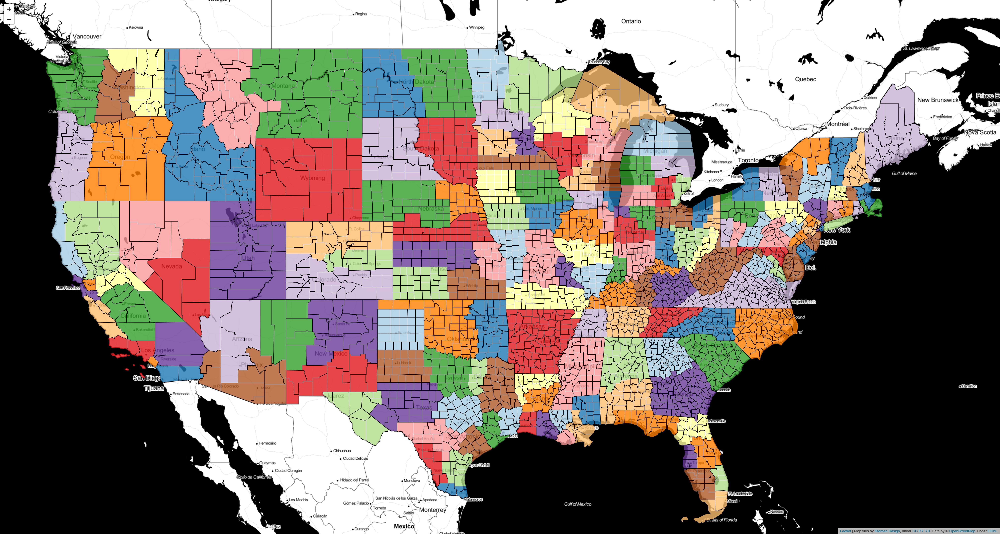

In [28]:
convert_png_to_smaller_jpg(png_folder = 'screenshots', 
png_image_name = 'diocese_map.png', jpg_folder = 'smaller_screenshots', 
quality_factor = 80)

IPython.display.Image(filename='smaller_screenshots/'+'diocese_map.jpg') 
# Based on https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html

In [29]:
end_time = time.time()
run_time = end_time - start_time
run_minutes = run_time // 60
run_seconds = run_time % 60
print("Completed run at",time.ctime(end_time),"(local time)")
print("Total run time:",'{:.2f}'.format(run_time),
"second(s) ("+str(run_minutes),"minute(s) and",'{:.2f}'.format(run_seconds),
"second(s))") 
# Only meaningful when the program is run nonstop from start to finish

Completed run at Sat May 14 16:24:54 2022 (local time)
Total run time: 19.42 second(s) (0.0 minute(s) and 19.42 second(s))
